# EDA

## Setup

### Loading Custom Modules

In this notebook we will use `etl_pipeline`, created in dqc notebook, but it contains some custom transformers, so I've created module with all dependenties for pipeline. You can install it by running next cell.

In [1]:
%pip install ..\scripts -q
print("Instalation Complitted!")

Note: you may need to restart the kernel to use updated packages.
Instalation Complitted!


### Importing Modules

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly as px

from etl.transformers import * # dependencies for etl pipeline

from pickle import dump, load

### Importing Data

In [3]:
item_categories = pd.read_csv("../data/item_categories.csv")
shops = pd.read_csv("../data/shops.csv")
items = pd.read_csv("../data/items.csv")

sales_train = pd.read_csv("../data/sales_train.csv")
test = pd.read_csv("../data/test.csv", index_col=0)

Also, now we have a DQC-ETL pipeline, so lets use it in order to transform it and make in ready for EDA

In [4]:
etl_pipeline = load(open("../pipelines/etl_pipeline_v1.pkl", "rb"))

In [5]:
sales_train = pd.read_csv("../data/sales_train.csv")
train = etl_pipeline.fit_transform(sales_train)
train

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
0,2013-01-02,0,999.00,1.0,"Ярославль ТЦ ""Альтаир""",59,ЯВЛЕНИЕ 2012 (BD),22154,Кино - Blu-Ray,37
1,2013-01-03,0,899.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58
2,2013-01-05,0,899.00,-1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58
3,2013-01-06,0,1709.05,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE Who Do You Think We Are LP,2554,Музыка - Винил,58
4,2013-01-15,0,1099.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE 30 Very Best Of 2CD (Фирм.),2555,Музыка - CD фирменного производства,56
...,...,...,...,...,...,...,...,...,...,...
2935844,2015-10-10,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Nu Jazz Selection (digipack),7409,Музыка - CD локального производства,55
2935845,2015-10-09,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Golden Jazz Collection 1 2CD,7460,Музыка - CD локального производства,55
2935846,2015-10-14,33,349.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Best Of The 3 Tenors,7459,Музыка - CD локального производства,55
2935847,2015-10-22,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Relax Collection Planet MP3 (mp3-CD) (jewel),7440,Музыка - MP3,57


## EDA

It is important to notice, that in our dataset we dont have a target explicitly. In this task we will try to predict _`item_cnt_day`_ for every item in every shop for the next month.

There are many approaches on this task, but as a base solution, we will try to predict _`item_cnt_day`_ for every item in every shop for __the every day__ of next month. So we need to modify test set a bit, but now we will eda the train set, that we alrady have

In [6]:
train

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
0,2013-01-02,0,999.00,1.0,"Ярославль ТЦ ""Альтаир""",59,ЯВЛЕНИЕ 2012 (BD),22154,Кино - Blu-Ray,37
1,2013-01-03,0,899.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58
2,2013-01-05,0,899.00,-1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58
3,2013-01-06,0,1709.05,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE Who Do You Think We Are LP,2554,Музыка - Винил,58
4,2013-01-15,0,1099.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE 30 Very Best Of 2CD (Фирм.),2555,Музыка - CD фирменного производства,56
...,...,...,...,...,...,...,...,...,...,...
2935844,2015-10-10,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Nu Jazz Selection (digipack),7409,Музыка - CD локального производства,55
2935845,2015-10-09,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Golden Jazz Collection 1 2CD,7460,Музыка - CD локального производства,55
2935846,2015-10-14,33,349.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Best Of The 3 Tenors,7459,Музыка - CD локального производства,55
2935847,2015-10-22,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Relax Collection Planet MP3 (mp3-CD) (jewel),7440,Музыка - MP3,57


In [7]:
train["date_block_num"].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33])

We have only data for 33 date blocks, that means, that for this task we can asume, that we want to predict sales from November 2015

### Date

In [8]:
train_date_tf = train.drop([ "item_name", "item_id", "item_category_name", "shop_name"], axis="columns")
train_date_tf["day"] = train_date_tf["date"].apply(lambda x : x.day)
train_date_tf["weekday"] = train_date_tf["date"].apply(lambda x : x.weekday())
train_date_tf["week"] = train_date_tf["date"].apply(lambda x : x.week)
train_date_tf["month"] = train_date_tf["date"].apply(lambda x : x.month)
train_date_tf["quarter"] = train_date_tf["date"].apply(lambda x : x.quarter)
train_date_tf["year"] = train_date_tf["date"].apply(lambda x : x.year)

train_date_tf

,date,date_block_num,item_price,item_cnt_day,shop_id,item_category_id,day,weekday,week,month,quarter,year
0,2013-01-02,0,999.00,1.0,59,37,2,2,1,1,1,2013
1,2013-01-03,0,899.00,1.0,25,58,3,3,1,1,1,2013
2,2013-01-05,0,899.00,-1.0,25,58,5,5,1,1,1,2013
3,2013-01-06,0,1709.05,1.0,25,58,6,6,1,1,1,2013
4,2013-01-15,0,1099.00,1.0,25,56,15,1,3,1,1,2013
...,...,...,...,...,...,...,...,...,...,...,...,...
2935844,2015-10-10,33,299.00,1.0,25,55,10,5,41,10,4,2015
2935845,2015-10-09,33,299.00,1.0,25,55,9,4,41,10,4,2015
2935846,2015-10-14,33,349.00,1.0,25,55,14,2,42,10,4,2015
2935847,2015-10-22,33,299.00,1.0,25,57,22,3,43,10,4,2015


In [9]:
px.plot(train_date_tf.loc[:, ["date", "item_cnt_day"]].groupby("date").sum().reset_index(),
       x="date", y="item_cnt_day", kind="line", title="Amount of items sold through whole timeline for every shop")

In [10]:
px.plot(train_date_tf.loc[:, ["year", "item_cnt_day"]].groupby("year").sum().reset_index(),
       x="year", y="item_cnt_day", kind="bar", title="Amount of items sold by years")

In [11]:
px.plot(train_date_tf.loc[:, ["year", "quarter", "item_cnt_day"]].groupby(["year", "quarter"]).sum().reset_index(),
        x="quarter", y="item_cnt_day", kind="line", title="Amount of Items sold by month for every shop", color="year")

In [12]:
px.plot(train_date_tf.loc[:, ["month", "item_cnt_day"]].groupby("month").sum().reset_index(),
        x="month", y="item_cnt_day", kind="line", title="Amount of Items sold by month for every shop")

In [13]:
px.plot(train_date_tf.loc[:, ["year", "month", "item_cnt_day"]].groupby(["year", "month"]).sum().reset_index(),
        x="month", y="item_cnt_day", kind="line", title="Amount of Items sold by month and year for every shop", color="year")

In [14]:
px.plot(train_date_tf.loc[:, ["weekday", "item_cnt_day"]].groupby("weekday").sum().reset_index(),
        x="weekday", y="item_cnt_day", kind="line", title="Amount of Items sold by weekday by every shop")

In [15]:
px.plot(train_date_tf.loc[:, ["week", "year", "item_cnt_day"]].groupby(["week", "year"]).sum().reset_index(),
        x="week", y="item_cnt_day", kind="line", title="Amount of Items sold by week and year by every shop", color="year")

On the last plot we can see some peaks for certain weeks. The numbers of this weeks are __1__, __8__, __10__, __21-22__, __40__ and __52__ . It could be a sign, that on that weeks there are events that affect sales. First and last weeks are standing for new year, but meaning of other peaks is unclear, so lets study them one by one

In [16]:
#first peak
print(pd.to_datetime(f'2013 8 1', format='%Y %W %w'))
print(pd.to_datetime(f'2014 8 1', format='%Y %W %w'))
print(pd.to_datetime(f'2015 8 1', format='%Y %W %w'))

2013-02-25 00:00:00
2014-02-24 00:00:00
2015-02-23 00:00:00


In [17]:
#second peak
print(pd.to_datetime(f'2013 10 1', format='%Y %W %w'))
print(pd.to_datetime(f'2014 10 1', format='%Y %W %w'))
print(pd.to_datetime(f'2015 10 1', format='%Y %W %w'))

2013-03-11 00:00:00
2014-03-10 00:00:00
2015-03-09 00:00:00


First and second peaks could correspond to the _Defender of the Fatherland Day_ in Russia (which is sometimes treated as a Men's day) and  to the _International Women's Day_

In [18]:
#third peak
print(pd.to_datetime(f'2014 22 1', format='%Y %W %w'))
print(pd.to_datetime(f'2015 21 1', format='%Y %W %w'))

2014-06-02 00:00:00
2015-05-25 00:00:00


The third peak corresponds to the start of summer.

In [19]:
#forth peak
print(pd.to_datetime(f'2013 40 1', format='%Y %W %w'))
print(pd.to_datetime(f'2014 40 1', format='%Y %W %w'))
print(pd.to_datetime(f'2015 40 1', format='%Y %W %w'))

2013-10-07 00:00:00
2014-10-06 00:00:00
2015-10-05 00:00:00


And the forth peak corresponds to start of october. Usually, there are big sales in the start of october, so it could be a reason for such increased purchases

Basing on these plots, we can already highlight few things:

1. On first plot we can see, that there are few peeks of purchases before a new year. We can explain the increase in sales by the fact that people buy gifts before the new year.
2. Also it is clear rather make purchases in the end of the week than in the begining. We can explain it by the fact, that people have more free time on the weekends and can go to shop to buy something.
3. And on the third plot we can see that there are less purchases in summer than in winter
4. Also it if important to notice a descending trend for sales by year, every year there are fewer sales.
5. There are some events during a year, that could affect sales.

### Date and Shops

In next section we will take a look on purchases depend on shop and item category and plot this data with the help of different plots

In [20]:
shops_amount = train_date_tf["shop_id"].unique().size
shops_amount

60

In [21]:
sales_by_shops = train_date_tf.loc[:, ["date", "item_cnt_day", "shop_id"]].groupby(["date", "shop_id"]).sum().reset_index()
sales_by_shops

,date,shop_id,item_cnt_day
0,2013-01-01,2,24.0
1,2013-01-01,7,89.0
2,2013-01-01,8,50.0
3,2013-01-01,13,31.0
4,2013-01-01,14,66.0
...,...,...,...
47223,2015-10-31,55,137.0
47224,2015-10-31,56,67.0
47225,2015-10-31,57,121.0
47226,2015-10-31,58,82.0


Before diging deep in shops analysis, we can think of a way to group shops data in order to easy their analysis. First, lets examine their names.

In [22]:
shops["shop_name"]

0                       !Якутск Орджоникидзе, 56 фран
1                       !Якутск ТЦ "Центральный" фран
2                                    Адыгея ТЦ "Мега"
3                      Балашиха ТРК "Октябрь-Киномир"
4                            Волжский ТЦ "Волга Молл"
5                              Вологда ТРЦ "Мармелад"
6                          Воронеж (Плехановская, 13)
7                              Воронеж ТРЦ "Максимир"
8                        Воронеж ТРЦ Сити-Парк "Град"
9                                   Выездная Торговля
10                         Жуковский ул. Чкалова 39м?
11                         Жуковский ул. Чкалова 39м²
12                                Интернет-магазин ЧС
13                                Казань ТЦ "Бехетле"
14                            Казань ТЦ "ПаркХаус" II
15                               Калуга ТРЦ "XXI век"
16                                   Коломна ТЦ "Рио"
17                      Красноярск ТЦ "Взлетка Плаза"
18                          

As you can see, we can notice a pattern in shops names. It looks like:

__City_Name__ __Type_of_shop__ __Other_info__

So we can make use of first two terms in this signature, so lets write a function to get this data from names

In [23]:
def get_city_name(x:str):
    if x[0] == "!":
        x = x[1:]
    return x.split()[0]

def get_shop_type(x:str):
    words = x.split()
    if x == "Цифровой склад 1С-Онлайн" or x == "Интернет-магазин ЧС":
            return "Digital"
    if x == "Выездная Торговля" or x == 'Москва "Распродажа"':
            return "Event"
    for word in words:
        if word.upper() == word and word.isalpha():
            return word
    
    return "Other"

In [24]:
shops["city_name"] = shops["shop_name"].apply(get_city_name)
shops["shop_type"] = shops["shop_name"].apply(get_shop_type)
shops

,shop_name,shop_id,city_name,shop_type
0,"!Якутск Орджоникидзе, 56 фран",0,Якутск,Other
1,"!Якутск ТЦ ""Центральный"" фран",1,Якутск,ТЦ
2,"Адыгея ТЦ ""Мега""",2,Адыгея,ТЦ
3,"Балашиха ТРК ""Октябрь-Киномир""",3,Балашиха,ТРК
4,"Волжский ТЦ ""Волга Молл""",4,Волжский,ТЦ
5,"Вологда ТРЦ ""Мармелад""",5,Вологда,ТРЦ
6,"Воронеж (Плехановская, 13)",6,Воронеж,Other
7,"Воронеж ТРЦ ""Максимир""",7,Воронеж,ТРЦ
8,"Воронеж ТРЦ Сити-Парк ""Град""",8,Воронеж,ТРЦ
9,Выездная Торговля,9,Выездная,Event


In [25]:
sales_by_shops_tf = train_date_tf.merge(shops, on="shop_id")
sales_by_shops_tf

,date,date_block_num,item_price,item_cnt_day,shop_id,item_category_id,day,weekday,week,month,quarter,year,shop_name,city_name,shop_type
0,2013-01-02,0,999.00,1.0,59,37,2,2,1,1,1,2013,"Ярославль ТЦ ""Альтаир""",Ярославль,ТЦ
1,2013-01-03,0,899.00,1.0,25,58,3,3,1,1,1,2013,"Москва ТРК ""Атриум""",Москва,ТРК
2,2013-01-05,0,899.00,-1.0,25,58,5,5,1,1,1,2013,"Москва ТРК ""Атриум""",Москва,ТРК
3,2013-01-06,0,1709.05,1.0,25,58,6,6,1,1,1,2013,"Москва ТРК ""Атриум""",Москва,ТРК
4,2013-01-15,0,1099.00,1.0,25,56,15,1,3,1,1,2013,"Москва ТРК ""Атриум""",Москва,ТРК
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2935841,2015-10-10,33,299.00,1.0,25,55,10,5,41,10,4,2015,"Москва ТРК ""Атриум""",Москва,ТРК
2935842,2015-10-09,33,299.00,1.0,25,55,9,4,41,10,4,2015,"Москва ТРК ""Атриум""",Москва,ТРК
2935843,2015-10-14,33,349.00,1.0,25,55,14,2,42,10,4,2015,"Москва ТРК ""Атриум""",Москва,ТРК
2935844,2015-10-22,33,299.00,1.0,25,57,22,3,43,10,4,2015,"Москва ТРК ""Атриум""",Москва,ТРК


When we have our data prepared, we can start analysis. First lets take a look on sales by cities

In [26]:
temp = sales_by_shops_tf.loc[:, ["week", "item_cnt_day", "city_name"]].groupby(["week", "city_name"]).mean().reset_index()
px.plot(temp, x="week", y="item_cnt_day", color="city_name", kind="line", title="Amount of sales by cities")

Using plotly, we can better analyse this graph because we can choose, what cities to show on the graph. Lets study this graph closely

1. Most popular shops are **_Internet shop_** and **_Digital warehouse_**. They have most average sales per month.
2. __*Itinerant trade*__ is also popular but very seasonal. We can see purchases only once a year
3. Next by popularity are shop in `Moscow` and `Saint-Petersburg` - two biggest cities in Russia
4. For other cities, we can see, that the patterns of sales are quite similar with a little price fluctuations depending on a city size, population etc.
5. For `Mytishchi` we can see the rarest graph with less sales 


Next, lets take a look on sales by shop types

In [27]:
temp = sales_by_shops_tf.loc[:, ["week", "item_cnt_day", "shop_type"]].groupby(["week", "shop_type"]).mean().reset_index()
px.plot(temp, x="week", y="item_cnt_day", color="shop_type", kind="line", title="Amount of sales by shop types")

Using plotly, we can better analyse this graph because we can choose, what cities to show on the graph. Lets study this graph closely

1. Most popular shop category is __Digital__, which is also stands for internet shops
2. Category __Events__ has a rare density and purchases in 'shop' of this category occures few times
3. For other shop types, we can see, that the patterns of sales are quite similar with a little price fluctuations

If we want to dig deeper, we can analyse every shop and look at their sales graphs

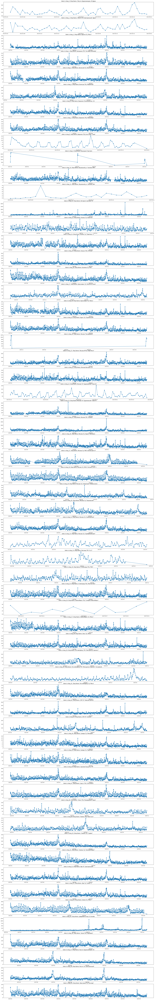

In [28]:
plt.figure(figsize=(30, 200))

for shop_id in range(shops_amount):
    plt.subplot(60, 1, shop_id + 1)
    particular_shop_id = sales_by_shops[sales_by_shops["shop_id"] == shop_id]
    plt.plot(particular_shop_id["date"], particular_shop_id["item_cnt_day"])
    plt.scatter(particular_shop_id["date"], particular_shop_id["item_cnt_day"])
    plt.title(f"Sales in shop_{shop_id}. Shop Name: {shops.iloc[shop_id]["shop_name"]}")

Most of the shops, that we have on these plots follow main tredns, that we found out, but some of them are different, let's explore these graphs in more detail:

1. Shops number __1__, __2__, __11__ : We can see that plots for these shops are rare, there are significantly less amount of records for these shops. The reason for it could be that shops __1__, __2__, __11__  are just missnamed shops __57__ and __58__ and __10__. If we compare their names, we will find out that they are same and differ only by a few characters. These characters are special, so they probably just had been encoded incorrectly.


2. Shop number __9__ is also different, there are even less records for this shop. Actually, this is don't even a shop. ID 9 is used to tag _itinerant trading_. And as you can see, this "store" works only few days in october (this object from April and last object are refunds, you can check it by running __*sales_by_shops[sales_by_shops["shop_id"] == 9]*__)

3. Shop number __20__ is also different, and actualy, with this shop we have simmilar situation as with shop number __9__. Shop number __20__ is also not a shop. It stands for sales events, which are also occure in October


4. Shop number __23__: This is a shop, which is located in the same shoping mall with shop number 24. Also it is important to notice that we only have information from 2013.01 to 2013.05, so theoreticaly(!), we can assume, that this shop is closed now.

5. For shop __25__ there are two intervals, for which we have no info about purchases, one in the middle of 2013 and one in the end of timeline we have for this data. That means, that probably this shop is still opened, but we have not fresh data about it

6. For shop number __32__ we also don't have a fresh information about sales. The information we have is distributed from 2013.01 to 2013.07 so here we also can theoreticly assume that this shop is closed now.

7. Shop number __33__ is relatively new, that is the reason, why we don't have a lot information about it. Also it is important to notice that for it we also don't have any relatively fresh info, because last transaction in this shop we know about was in April 2015

8. Shop number __36__ is completely new, we have only info about it last 2 weeks of work

9. For shop __55__ we can notice that its plot differs a lot from other shops. Because (again) it is not actually a shop, it is a digital warehouse. So we can notice that amount of goods sold per day is preatty uniform, except of New Year and October sales

### Date and Item Categories

In [29]:
item_category_amount = train_date_tf["item_category_id"].unique().size
item_category_amount

84

In [30]:
sales_by_item_category = train_date_tf.loc[:, ["date", "item_cnt_day", "item_category_id"]].groupby(["date", "item_category_id"]).sum().reset_index()
sales_by_item_category

,date,item_category_id,item_cnt_day
0,2013-01-01,2,30.0
1,2013-01-01,3,7.0
2,2013-01-01,4,10.0
3,2013-01-01,5,12.0
4,2013-01-01,6,13.0
...,...,...,...
55517,2015-10-31,75,31.0
55518,2015-10-31,76,4.0
55519,2015-10-31,77,2.0
55520,2015-10-31,79,28.0


Before diging deep in shops analysis, we can think of a way to group shops data in order to easy their analysis. First, lets examine their names.

In [31]:
print(item_categories["item_category_name"].values)

['PC - Гарнитуры/Наушники' 'Аксессуары - PS2' 'Аксессуары - PS3'
 'Аксессуары - PS4' 'Аксессуары - PSP' 'Аксессуары - PSVita'
 'Аксессуары - XBOX 360' 'Аксессуары - XBOX ONE' 'Билеты (Цифра)'
 'Доставка товара' 'Игровые консоли - PS2' 'Игровые консоли - PS3'
 'Игровые консоли - PS4' 'Игровые консоли - PSP'
 'Игровые консоли - PSVita' 'Игровые консоли - XBOX 360'
 'Игровые консоли - XBOX ONE' 'Игровые консоли - Прочие' 'Игры - PS2'
 'Игры - PS3' 'Игры - PS4' 'Игры - PSP' 'Игры - PSVita' 'Игры - XBOX 360'
 'Игры - XBOX ONE' 'Игры - Аксессуары для игр' 'Игры Android - Цифра'
 'Игры MAC - Цифра' 'Игры PC - Дополнительные издания'
 'Игры PC - Коллекционные издания' 'Игры PC - Стандартные издания'
 'Игры PC - Цифра' 'Карты оплаты (Кино, Музыка, Игры)'
 'Карты оплаты - Live!' 'Карты оплаты - Live! (Цифра)'
 'Карты оплаты - PSN' 'Карты оплаты - Windows (Цифра)' 'Кино - Blu-Ray'
 'Кино - Blu-Ray 3D' 'Кино - Blu-Ray 4K' 'Кино - DVD'
 'Кино - Коллекционное' 'Книги - Артбуки, энциклопедии'
 'Книги

As you can notice there is clear pattern in categories name, which looks like:

'__Item_Group__ - __Item_Subgroup__'

So that means, that we can write a function, which extract item group from category name and then analyse them

In [32]:
def get_group(x:str):
	if x.find("-") == -1:
		return x
	return x[ : x.find("-")  - 1]

In [33]:
item_categories["group"] = item_categories["item_category_name"].apply(get_group)
item_categories

,item_category_name,item_category_id,group
0,PC - Гарнитуры/Наушники,0,PC
1,Аксессуары - PS2,1,Аксессуары
2,Аксессуары - PS3,2,Аксессуары
3,Аксессуары - PS4,3,Аксессуары
4,Аксессуары - PSP,4,Аксессуары
...,...,...,...
79,Служебные,79,Служебные
80,Служебные - Билеты,80,Служебные
81,Чистые носители (шпиль),81,Чистые носители (шпиль)
82,Чистые носители (штучные),82,Чистые носители (штучные)


In [34]:
item_categories["group"].unique()

array(['PC', 'Аксессуары', 'Билеты (Цифра)', 'Доставка товара',
       'Игровые консоли', 'Игры', 'Игры Android', 'Игры MAC', 'Игры PC',
       'Карты оплаты (Кино, Музыка, Игры)', 'Карты оплаты', 'Кино',
       'Книги', 'Музыка', 'Подарки', 'Программы', 'Служебные',
       'Чистые носители (шпиль)', 'Чистые носители (штучные)',
       'Элементы питания'], dtype=object)

In [35]:
len(item_categories["group"].unique())

20

As you can see, we've reduced amount of categories from 84 to 20, which is incredible result!

Now, using this new feature, we can analyse, how different item groups affect sales

In [36]:
sales_by_item_category_tf = train_date_tf.merge(item_categories, on="item_category_id")
sales_by_item_category_tf

,date,date_block_num,item_price,item_cnt_day,shop_id,item_category_id,day,weekday,week,month,quarter,year,item_category_name,group
0,2013-01-02,0,999.00,1.0,59,37,2,2,1,1,1,2013,Кино - Blu-Ray,Кино
1,2013-01-03,0,899.00,1.0,25,58,3,3,1,1,1,2013,Музыка - Винил,Музыка
2,2013-01-05,0,899.00,-1.0,25,58,5,5,1,1,1,2013,Музыка - Винил,Музыка
3,2013-01-06,0,1709.05,1.0,25,58,6,6,1,1,1,2013,Музыка - Винил,Музыка
4,2013-01-15,0,1099.00,1.0,25,56,15,1,3,1,1,2013,Музыка - CD фирменного производства,Музыка
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2935841,2015-10-10,33,299.00,1.0,25,55,10,5,41,10,4,2015,Музыка - CD локального производства,Музыка
2935842,2015-10-09,33,299.00,1.0,25,55,9,4,41,10,4,2015,Музыка - CD локального производства,Музыка
2935843,2015-10-14,33,349.00,1.0,25,55,14,2,42,10,4,2015,Музыка - CD локального производства,Музыка
2935844,2015-10-22,33,299.00,1.0,25,57,22,3,43,10,4,2015,Музыка - MP3,Музыка


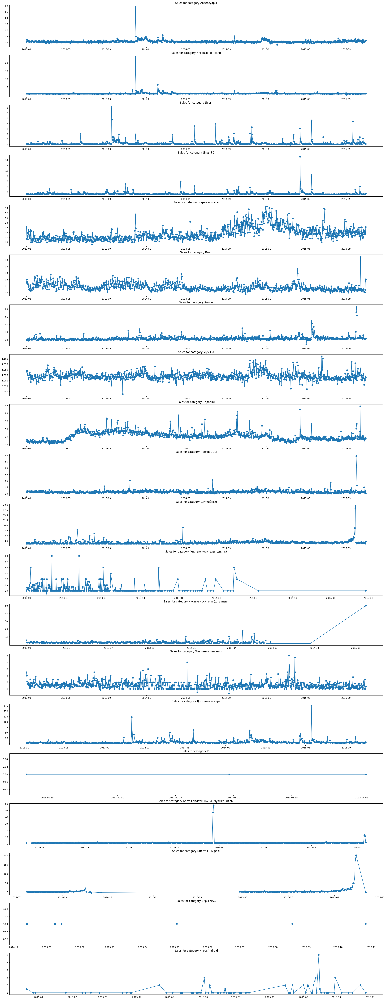

In [37]:
plt.figure(figsize=(30, 80))

temp = sales_by_item_category_tf.loc[:, ["date", "item_cnt_day", "group"]].groupby(["date", "group"]).mean().reset_index()
groups = temp["group"].unique()

for category_id in range(groups.size):
    plt.subplot(20, 1, category_id + 1)
    particular_category_id = temp[temp["group"] == groups[category_id]]
    plt.plot(particular_category_id["date"], particular_category_id["item_cnt_day"])
    plt.scatter(particular_category_id["date"], particular_category_id["item_cnt_day"])
    plt.title(f"Sales for category {groups[category_id]}")

There are few thing, that we can notice from that graphs:

1. Group __*Tickets*__ has a huge seasonality, and usualy items from that category are bought during events etc.
2. Some categories, like __*Android games*__ or __*Mac Games*__ are just very rare, they graphs look spiky and purchases from that category are likely to be random
3. Some categories, like __*Gift cards*__ or __*Service programs*__ have outliers, which might cause some problems in future,
4. Categories, connected with media, like games, films etc. , have a lot of peeks, which might be connected with new films or games, which are quite popular on the release date.
5. Also, for some categories, like __*Drives*__  we can notice, that they are no more on the market.

If we want to dig deeper, we can analyse every category and look at their sales graphs

In [38]:
plt.figure(figsize=(30, 300))

for category_id in range(item_category_amount):
    plt.subplot(84, 1, category_id + 1)
    particular_category_id = sales_by_item_category[sales_by_item_category["item_category_id"] == category_id]
    plt.plot(particular_category_id["date"], particular_category_id["item_cnt_day"])
    plt.scatter(particular_category_id["date"], particular_category_id["item_cnt_day"])
    plt.title(f"Sales for category {category_id}. Category Name: {item_categories.iloc[category_id]["item_category_name"]}. Object amount: {sales_by_item_category[sales_by_item_category["item_category_id"] == category_id].shape[0]}")

Most of the item categories, that we have on these plots follow main tredns, that we found out, but some of them are different, let's explore these graphs in more detail:

1. Categories __0__ and __1__, __10__ have only few records on their plots and all these records are relatively old, so we can say that sales of this categories are rare events.

2. For categories __4__ and __13__ we can notice descending trend. In the start of 2013 items of these categories were popular, but starting from 2014 sales of items from these categories became more and more rare. It could be explained by the fact, that these categories describe items for PSP which is kinda old game console which is not trending anymore, because there are a lot of other game console, which are better.

3. For category __8__ we can notice some seasonality. This category stands for digital tickets. If you run `items[items["item_category_id"] == 8]`you will see, that all items for this category are tickets for event called "Игромир", which usually takes place in October, so, that's the reason of such seasonality



In [39]:
items[items["item_category_id"] == 8]

,item_name,item_id,item_category_id
9241,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",9241,8
9242,"Билет ""ИгроМир 2014"" (на один день (отдельно -...",9242,8
9243,"Билет ""ИгроМир 2014"" - семейный до 4-х человек...",9243,8
9245,"Билет ""ИгроМир 2015"" - 2 октября 2015 (сайт) У...",9245,8
9247,"Билет ""ИгроМир 2015"" - 2 октября 2015 УПР [Циф...",9247,8
9249,"Билет ""ИгроМир 2015"" - 3 октября 2015 (сайт) У...",9249,8
9251,"Билет ""ИгроМир 2015"" - 3 октября 2015 УПР [Циф...",9251,8
9253,"Билет ""ИгроМир 2015"" - 4 октября 2015 (сайт) У...",9253,8
9255,"Билет ""ИгроМир 2015"" - 4 октября 2015 УПР [Циф...",9255,8


4. For category __9__ we can notice uniform distribution with some peeks. It can be explained by the fact, that category __9__ stands for item delivery which is popular service people use every day

5. For category __12__ we can also notice uniform dustribution with some peeks for new year and at the start of timeline. This first peek could be explained by the fact, that this category stands for PS4 console, which went on sale in the end of 2013, so this console was new and a lot of people, who play games on consoles, wanted to upgrade their game devices. After that peek, sales of a console were pretty same.

6. Category __17__ stands for very old and niche consoles, and that is the reason of such amount of sales for items from this category

7. For category __18__ we can also notice just few sales. The reason for it is that this category describes games for PS2 console, which is very old (it was launched in 2000!) and there are very few people who still play it.

8. For category __20__ we can see multimodal plot. Category __20__ describes games for PS4. PS4 was newest game console and there were a lot of new games for it, so that could be the reason of peeks on the plot (Witcher 3: Wild Hunt, GTA , Bloodborne)

In [40]:
train[train["item_category_id"] == 20].sort_values(by="item_cnt_day", ascending=False)[:25]

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
2660602,2015-05-19,28,3497.693478,230.0,"СПб ТК ""Невский Центр""",42,"Ведьмак 3: Дикая охота [PS4, русская версия]",10210,Игры - PS4,20
2625791,2015-05-19,28,3482.181818,187.0,Интернет-магазин ЧС,12,"Ведьмак 3: Дикая охота [PS4, русская версия]",10210,Игры - PS4,20
2185126,2014-11-18,22,3069.658683,167.0,"СПб ТК ""Сенная""",43,"Grand Theft Auto V [PS4, русские субтитры]",3733,Игры - PS4,20
2176634,2014-11-18,22,3070.564626,147.0,"Москва ТРК ""Атриум""",25,"Grand Theft Auto V [PS4, русские субтитры]",3733,Игры - PS4,20
2190983,2014-11-18,22,3071.676056,142.0,"СПб ТК ""Невский Центр""",42,"Grand Theft Auto V [PS4, русские субтитры]",3733,Игры - PS4,20
2144362,2014-11-19,22,3053.443662,142.0,Интернет-магазин ЧС,12,"Grand Theft Auto V [PS4, русские субтитры]",3733,Игры - PS4,20
2615680,2015-05-19,28,3496.761194,134.0,"Москва ТРК ""Атриум""",25,"Ведьмак 3: Дикая охота [PS4, русская версия]",10210,Игры - PS4,20
2532946,2015-03-25,26,4485.472441,127.0,Интернет-магазин ЧС,12,Bloodborne: Порождение крови. Коллекционное из...,1971,Игры - PS4,20
1703732,2014-05-27,16,2999.000000,112.0,"СПб ТК ""Невский Центр""",42,"Watch_Dogs. Специальное издание [PS4, русская ...",7807,Игры - PS4,20
2628859,2015-05-19,28,3496.169811,106.0,"Москва ТЦ ""Семеновский""",31,"Ведьмак 3: Дикая охота [PS4, русская версия]",10210,Игры - PS4,20


9. Categories __26__ and __27__ have few records because they are just not popular and people seems don't buy items from this category often

10. For categories __28__, __29__ and __30__ we can see a lot of different peeks on a gpaph. This categories describe standard and deluxe game editions and expansions for games. If we check what games where sold mostly and their release date , we will see, that the reason if these peeks are the new games that were coming out at the time (like Witcher 3: Wild Hunt, Diablo 3: Reaper of Souls, Battlefield 4 etc.)

In [41]:
train[train["item_category_id"] == 28].sort_values(by="item_cnt_day", ascending=False)[:25]

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
2625847,2015-05-19,28,1499.000000,480.0,Интернет-магазин ЧС,12,"Ведьмак 3: Дикая охота [PC, русская версия]",10209,Игры PC - Дополнительные издания,28
2660666,2015-05-19,28,1498.997207,179.0,"СПб ТК ""Невский Центр""",42,"Ведьмак 3: Дикая охота [PC, русская версия]",10209,Игры PC - Дополнительные издания,28
2615667,2015-05-19,28,1490.891892,148.0,"Москва ТРК ""Атриум""",25,"Ведьмак 3: Дикая охота [PC, русская версия]",10209,Игры PC - Дополнительные издания,28
1586766,2014-04-15,15,877.841045,134.0,"Воронеж (Плехановская, 13)",6,"Diablo III: Reaper of Souls (дополнение) [PC, ...",2814,Игры PC - Дополнительные издания,28
1612509,2014-04-15,15,887.493985,133.0,"Москва ТЦ ""Семеновский""",31,"Diablo III: Reaper of Souls (дополнение) [PC, ...",2814,Игры PC - Дополнительные издания,28
963528,2013-10-29,9,1197.110236,127.0,"Москва ТЦ ""Семеновский""",31,"Battlefield 4 Limited Edition [PC, русская вер...",1849,Игры PC - Дополнительные издания,28
949279,2013-10-29,9,1199.000000,118.0,"Воронеж (Плехановская, 13)",6,"Battlefield 4 Limited Edition [PC, русская вер...",1849,Игры PC - Дополнительные издания,28
2628847,2015-05-19,28,1496.435897,117.0,"Москва ТЦ ""Семеновский""",31,"Ведьмак 3: Дикая охота [PC, русская версия]",10209,Игры PC - Дополнительные издания,28
944059,2013-10-29,9,1199.000000,113.0,"СПб ТК ""Невский Центр""",42,"Battlefield 4 Limited Edition [PC, русская вер...",1849,Игры PC - Дополнительные издания,28
2620219,2015-05-19,28,1499.000000,110.0,"Воронеж (Плехановская, 13)",6,"Ведьмак 3: Дикая охота [PC, русская версия]",10209,Игры PC - Дополнительные издания,28


In [42]:
train[train["item_category_id"] == 29].sort_values(by="item_cnt_day", ascending=False)[:25]

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
1650935,2014-05-27,16,3993.736842,171.0,Интернет-магазин ЧС,12,"Watch_Dogs. Dedsec Edition [PC, русская версия]",7794,Игры PC - Коллекционные издания,29
2625804,2015-05-19,28,8499.000000,140.0,Интернет-магазин ЧС,12,Ведьмак 3: Дикая охота. Коллекционное издание ...,10212,Игры PC - Коллекционные издания,29
1582402,2014-04-15,15,2999.000000,138.0,Интернет-магазин ЧС,12,Diablo III: Reaper of Souls (дополнение). Колл...,2815,Игры PC - Коллекционные издания,29
1650986,2014-05-27,16,2792.076923,130.0,Интернет-магазин ЧС,12,"Watch_Dogs. Vigilante Edition [PC, русская вер...",7798,Игры PC - Коллекционные издания,29
1058429,2013-11-22,10,2413.206349,126.0,Интернет-магазин ЧС,12,Assassin's Creed IV. Черный флаг. Buccaneer Ed...,1502,Игры PC - Коллекционные издания,29
1058422,2013-11-22,10,4370.750000,104.0,Интернет-магазин ЧС,12,Assassin's Creed IV. Черный флаг. Black Chest ...,1498,Игры PC - Коллекционные издания,29
2144642,2014-11-13,22,2999.000000,97.0,Интернет-магазин ЧС,12,World of Warcraft: Warlords of Draenor (дополн...,7861,Игры PC - Коллекционные издания,29
2014024,2014-09-04,20,2371.222222,90.0,Интернет-магазин ЧС,12,"Sims 4 Коллекционное издание [PC, русская версия]",6504,Игры PC - Коллекционные издания,29
1058428,2013-11-21,10,2440.236111,72.0,Интернет-магазин ЧС,12,Assassin's Creed IV. Черный флаг. Buccaneer Ed...,1502,Игры PC - Коллекционные издания,29
2865671,2015-09-29,32,5499.000000,71.0,Интернет-магазин ЧС,12,Меч и Магия. Герои VII. Коллекционное издание ...,15067,Игры PC - Коллекционные издания,29


In [43]:
train[train["item_category_id"] == 30].sort_values(by="item_cnt_day", ascending=False)[:25]

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
2608040,2015-04-14,27,1904.548077,624.0,Интернет-магазин ЧС,12,"Grand Theft Auto V [PC, русские субтитры]",3731,Игры PC - Стандартные издания,30
2597018,2015-04-14,27,1918.732441,299.0,"СПб ТК ""Невский Центр""",42,"Grand Theft Auto V [PC, русские субтитры]",3731,Игры PC - Стандартные издания,30
2567454,2015-04-14,27,1941.995169,207.0,"Москва ТРК ""Атриум""",25,"Grand Theft Auto V [PC, русские субтитры]",3731,Игры PC - Стандартные издания,30
566159,2013-06-11,5,999.000000,200.0,Интернет-магазин ЧС,12,"Diablo III [PC, Jewel, русская версия]",2808,Игры PC - Стандартные издания,30
2555809,2015-04-14,27,1946.953216,171.0,"Москва ТЦ ""Семеновский""",31,"Grand Theft Auto V [PC, русские субтитры]",3731,Игры PC - Стандартные издания,30
1014331,2013-10-06,9,498.992262,168.0,Выездная Торговля,9,"Total War: Rome 2 [PC, Jewel, русская версия]",7096,Игры PC - Стандартные издания,30
1710946,2014-06-20,17,74.000000,151.0,"Москва ТЦ ""МЕГА Белая Дача II""",27,"Remember me [PC, Jewel, русские субтитры]",6111,Игры PC - Стандартные издания,30
836296,2013-08-29,7,999.000000,150.0,Интернет-магазин ЧС,12,"Diablo III [PC, Jewel, русская версия]",2808,Игры PC - Стандартные издания,30
2605020,2015-04-14,27,1930.034483,145.0,"Красноярск ТЦ ""Июнь""",18,"Grand Theft Auto V [PC, русские субтитры]",3731,Игры PC - Стандартные издания,30
2599393,2015-04-14,27,1933.057971,138.0,"Воронеж (Плехановская, 13)",6,"Grand Theft Auto V [PC, русские субтитры]",3731,Игры PC - Стандартные издания,30


11. For category __32__ we can see one peek in April 2014 but there is nothing strange, it is just a huge purchase of a gift cards

12. Items from category __36__ probably are just new, because we have very few records for this item family

13. Item from category __39__ are not very popular, so it is hard to describe any paterns in their sales

14. For category __42__ we can see a strange peek in the middle of May 2015. If we take a look on a data and surf in the internet a bit, we will find out, that this peek could be explained by the fact, that there were artbooks coming out in May about famous fictional universes (like Witcher, Adventure Time, Last of Us etc.)

In [44]:
train[train["item_category_id"] == 42].sort_values(by="item_cnt_day", ascending=False)[:25]

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
2662538,2015-05-19,28,1250.000000,48.0,"СПб ТК ""Невский Центр""",42,Энциклопедия Мир Ведьмака,22102,"Книги - Артбуки, энциклопедии",42
2623133,2015-05-26,28,1250.000000,32.0,Интернет-магазин ЧС,12,Энциклопедия Мир Ведьмака,22102,"Книги - Артбуки, энциклопедии",42
2912179,2015-10-04,33,629.000000,19.0,"Москва ""Распродажа""",20,Энциклопедия Adventure Time,22100,"Книги - Артбуки, энциклопедии",42
2631614,2015-05-19,28,1250.000000,18.0,"Москва ТЦ ""Семеновский""",31,Энциклопедия Мир Ведьмака,22102,"Книги - Артбуки, энциклопедии",42
2638651,2015-05-20,28,1250.000000,17.0,"Москва ТРК ""Атриум""",25,Энциклопедия Мир Ведьмака,22102,"Книги - Артбуки, энциклопедии",42
2911082,2015-10-03,33,998.993333,15.0,"Москва ""Распродажа""",20,Артбук Мир игры The Last Of Us,8550,"Книги - Артбуки, энциклопедии",42
2919668,2015-10-04,33,629.000000,15.0,Выездная Торговля,9,Энциклопедия Adventure Time,22100,"Книги - Артбуки, энциклопедии",42
2623230,2015-05-19,28,1219.285714,14.0,Интернет-магазин ЧС,12,Энциклопедия Мир Ведьмака,22102,"Книги - Артбуки, энциклопедии",42
2919667,2015-10-03,33,629.000000,14.0,Выездная Торговля,9,Энциклопедия Adventure Time,22100,"Книги - Артбуки, энциклопедии",42
2935102,2015-10-23,33,1249.000000,13.0,"Москва ТРК ""Атриум""",25,Артбук Мир игры Assassin's Creed Syndicate,8546,"Книги - Артбуки, энциклопедии",42


15. For categories __46__, __48__, __50__, __51__, __52__, __53__ we can see that products from these categories are sold very rarely. All this categories connected with books

16. For categories __59__, __66__, __81__, __82__ we can notice that amount of sales per day is descending and we can assume, that items from these categories can't be sold anymore

17. Categories __68__ and __74__ have very few object, so it is hard to notice any patterns. For category __68__ we also don't have any fresh data, we can assume, that items from these categories can't be sold anymore

18. Items from category __77__ have a descending trend for sales, but people still buy them

20. For category __79__ on the graph we see a gradual rise and fall of the function with a peak during the new year

### Interim summary

For the moment we can already summarize some things, that we found out on graphs:

1. __Increased sales__ during __New Year Holidays__, __October Sales__ etc. People are buying presents for each other or just buying items on sales. So if we create feature, which will tell us if its is october or new year holidays, it could be usefull in predictions

2. __Increased sales__ __on weekends__ (_Friday_, _Saturday_ and _Sunday_)

3. For a lot of categories we also can notice see __Sales peeks of new products on the market__. When new product comes on the market, like new game, film, artbook etc. , usually a lot of people want to buy it. But after hype around this products, their sales become more flat and regular. So we can detect new products on a market and treat first days sales in first days as an __outliers__

4. Also some of products have a __descending trend__ in their sales. That could mean two things:

	1. Over time, the popularity of products in this category __has decreased significantly__ and now people __buying less of them__
	
	2. Over time, people __stopped buying__ items from this category. 

	Based on this information we can use only fresh data for predictions or manualy predict sales of some categories as zero

5. For some categories we can notice strong __Seasonality__. For example tickets on event, which usually takes place in October, will be mostly sold in summer-autumn, than in winter or spring. Information about season also could be a good and usefull feature.

6. __In general__, we can notice __Seasonality__ in our data. If we take a look on a _year_ feature, we will notice descending trend, and if we take a look on a _month_ feature, we will notice, that goods are likely to be sold in autumn-winter than in spring-summer.

7. Some of the __shops__ have __no fresh data__ about their work, so we can assume that this __shops are closed now__. Based on this information we can identify closed shops and predict their sales as 0 manually.

8. Some of __shops are not really shops__. They could just describe warehouses, delivery or internet shop, so they have a bit other patterns in sells
	

### Prices

#### Correlations

In [DQC](..\notebooks\dqc.ipynb) we studied distributions over different features, and while studing `item_price` feature we found out, that it is left-skewed and multimodal. That mean, that we can try to apply log transformation and clusterization algorithm in order to create new feature

But before we go into clustering things, there is one thing that we could study and it is `item_price` and `item_cnt_day` features correlations

In [45]:
price_sales_df = train.loc[:, ["date", "item_price", "item_category_id", "item_cnt_day"]].groupby(["date", "item_category_id"]).agg({"item_price" : "mean", "item_cnt_day" : "sum"}).reset_index()
price_sales_df

,date,item_category_id,item_price,item_cnt_day
0,2013-01-01,2,2032.917143,30.0
1,2013-01-01,3,456.110000,7.0
2,2013-01-01,4,589.888889,10.0
3,2013-01-01,5,720.608333,12.0
4,2013-01-01,6,1597.615385,13.0
...,...,...,...,...
55517,2015-10-31,75,2577.206897,31.0
55518,2015-10-31,76,1170.750000,4.0
55519,2015-10-31,77,229.000000,2.0
55520,2015-10-31,79,1137.577381,28.0


In [46]:
index = []
values = []

for category_id in range(item_category_amount):
    particular_category_id = price_sales_df[price_sales_df["item_category_id"] == category_id]
    corr = particular_category_id.corr()["item_cnt_day"]["item_price"]
    if not np.isnan(corr):
        values.append(corr)
        index.append(category_id)
    
pd.Series(values, index=index).sort_values(key=lambda x: abs(x))[-30:]

22    0.185545
70    0.193995
26   -0.196287
57   -0.207957
35    0.208152
76    0.219087
13    0.228060
71   -0.235207
62   -0.245759
39   -0.252001
42    0.265010
14   -0.265733
5     0.268932
6    -0.272762
75   -0.274949
40   -0.301874
38    0.302726
11   -0.334545
79    0.343947
2    -0.348236
30   -0.351817
18   -0.353711
67   -0.360690
36    0.368494
80    0.390687
8     0.396945
3     0.417672
55   -0.425966
4     0.437490
66    0.520775
dtype: float64

As you can see, for some categories, price could be a good feature, which contains useful information, but lets also try to cluster prices and find more general patterns.

#### Clusterization

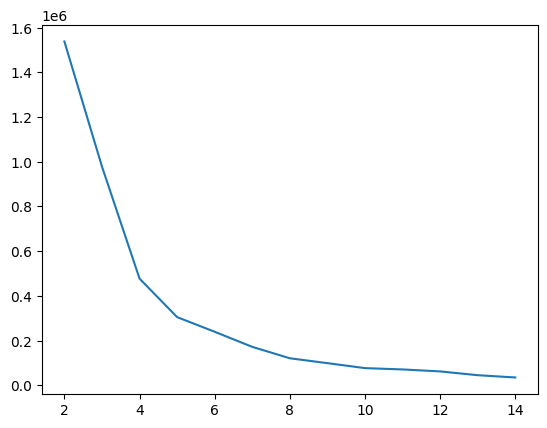

In [47]:
from sklearn.cluster import KMeans

price_data = train[train["item_price"] < train["item_price"].quantile(0.99)]["item_price"].apply(lambda x : np.log(x))

k_values = range(2, 15)
inertias = []

for k in range(2, 15):
    model = KMeans(n_clusters=k, random_state=52)
    model.fit(price_data.values.reshape(-1, 1))
    inertias.append(model.inertia_)
    
plt.plot(k_values, inertias)
    

With the help of elbow plot we can find that 4 is optimal amount of clusters for prices. So lets create model for clustering and then create feature, which will show price category of item

In [48]:
price_data = train["item_price"].apply(lambda x : np.log(x))

model = KMeans(n_clusters=4, random_state=52)
model.fit(price_data.values.reshape(-1, 1))

KMeans(n_clusters=4, random_state=52)

Next, after model is fitted, we will predict item cluster dominant price of an item and then put this infornmation into train set

In [49]:
price_modes = train.loc[:, ["item_id", "item_price"]].groupby("item_id").agg({"item_price": lambda x : x.mode()[0]}).reset_index()
price_modes["price_cluster"] = price_modes["item_price"].apply(lambda x : model.predict(np.log(x).reshape(1, -1))[0])
price_modes = price_modes.set_index("item_id")
price_cluster_map = price_modes["price_cluster"].to_dict()

train_tf = train.copy()
train_tf["price_category"] = train_tf["item_id"].apply(lambda x: price_cluster_map[x])
train_tf

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id,price_category
0,2013-01-02,0,999.00,1.0,"Ярославль ТЦ ""Альтаир""",59,ЯВЛЕНИЕ 2012 (BD),22154,Кино - Blu-Ray,37,3
1,2013-01-03,0,899.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58,3
2,2013-01-05,0,899.00,-1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58,3
3,2013-01-06,0,1709.05,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE Who Do You Think We Are LP,2554,Музыка - Винил,58,1
4,2013-01-15,0,1099.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE 30 Very Best Of 2CD (Фирм.),2555,Музыка - CD фирменного производства,56,3
...,...,...,...,...,...,...,...,...,...,...,...
2935844,2015-10-10,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Nu Jazz Selection (digipack),7409,Музыка - CD локального производства,55,0
2935845,2015-10-09,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Golden Jazz Collection 1 2CD,7460,Музыка - CD локального производства,55,0
2935846,2015-10-14,33,349.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Best Of The 3 Tenors,7459,Музыка - CD локального производства,55,0
2935847,2015-10-22,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Relax Collection Planet MP3 (mp3-CD) (jewel),7440,Музыка - MP3,57,0


In [50]:
price_categories = train_tf.loc[:, ["price_category", "item_cnt_day", "date_block_num"]].groupby(["price_category","date_block_num"]).sum().reset_index()
px.plot(data_frame=price_categories, x="date_block_num", y="item_cnt_day", color="price_category", kind="line")

In [51]:
print(model.get_feature_names_out())
print(model.cluster_centers_)

['kmeans0' 'kmeans1' 'kmeans2' 'kmeans3']
[[5.46002169]
 [7.79996928]
 [1.77405908]
 [6.62494351]]


On that plot we can see, that:
1. Depending on price category we, we can roughly say, what are the sales of different items. For example, items from categories __1__ and __2__ are rarest and from categories __0__ and __3__ are most frequent ones

2. Also important thing to notice that for some categories we can clearly see __seasonality__ (for price families __0__, __1__ and __3__ we can see peaks in the new year)

3. Also we can notice a __descending trend__ on a graph, but the reason for it could be that for some categories we dont have a fresh information

Lest also check __*correlation*__ and __*mi score*__ in order to check its usability

In [52]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse_output=False)
price_categories_ = pd.concat([price_categories, pd.DataFrame(encoder.fit_transform(price_categories[["price_category"]]), columns=encoder.get_feature_names_out())], axis="columns")

price_categories_.corr()["item_cnt_day"]

price_category     -0.309809
date_block_num     -0.263525
item_cnt_day        1.000000
price_category_0    0.617849
price_category_1   -0.203355
price_category_2   -0.646915
price_category_3    0.232421
Name: item_cnt_day, dtype: float64

In [53]:
from sklearn.feature_selection import mutual_info_regression
mi = mutual_info_regression(price_categories[['price_category']], price_categories['item_cnt_day'])
print(mi)

[0.79634763]


As you can see, based on correlations and mi score, we can conclude, that this feature could be useful for preditcions 

### Shops and their schedule

In [54]:
shops_schedule = train_date_tf.loc[:, ["shop_id", "item_cnt_day", "weekday"]]
shops_schedule.groupby(["shop_id", "weekday"]).sum().reset_index()
shops_schedule[shops_schedule["item_cnt_day"] == 0]

,shop_id,item_cnt_day,weekday


As you can see all shops work full week, so we don't have to check shop is open or not

## Conclusions

We have completed EDA for our dataset and in this section I want to summarize things that we found out during analysis and describe, what transformation we will apply to dataset in next section, when we will write pipelines

####  __Features to create:__

1. __Weekday__ and __Month__ : As we found out, there is a clear seasonality in sales number, so it could be a nice feature for our future model

2. __Holidays and Special Events__ : in this dataset we've found out, that before new year we have increased purchases, so we can use it in predictions

3. __Price Clusters__: the price of the product affects the number of sales

4. __Encoded Categories and Shops__ : item category and shop could contain very useful info for our future models 


#### __Data to transform and preprocess:__

1. __New products on the market__ : When something new appears on the market, usually, a lot of people want to buy it, so we can find this information and delete it as an outlier.

2. __Closed shops__: Based on data we have, we can find shops which are closed and do not use them in training and also predict sales for them separately 

3. __Fresh data__: For a lot of shops we've noticed, that amount of sales during their existance decreased, so if we want to accurately predict their sales, we have to use fresh data 
 
4. __Other Outliers__: In [DQC](../notebooks/dqc.ipynb) we found some ouliers, but didn't delete them because there was no error in this data, but for model this data can affect model results, so it will be better to delete this data


## Pipelines

In [61]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans
from datetime import timedelta

class SeasonalityTransformer(BaseEstimator, TransformerMixin):
    
    def __init__ (self, date_column):
        self.date_column = date_column
        
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X_transformed = X.copy()
        X_transformed["weekday"] = X[self.date_column].apply(lambda x : x.weekday())
        X_transformed["month"] = X[self.date_column].apply(lambda x : x.month)
        X_transformed["year"] = X[self.date_column].apply(lambda x : x.year)
        
        return X_transformed
    
    
class EventsTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, date_column):
        self.date_column = date_column
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X_transformed = X.copy()
        X_transformed["is_NewYear"] = X[self.date_column].apply(lambda x : 1 if (x.month == 12 and x.day > 20) else 0)
        X_transformed["is_OctoberSales"] = X[self.date_column].apply(lambda x : 1 if (x.month == 10 and x.day < 10) else 0)
        
        return X_transformed
    
    
class PriceClusterTransform(BaseEstimator, TransformerMixin):
    
    def __init__ (self, price_column, n_clusters):
        self.price_column = price_column
        self.n_clusters = n_clusters
        self.model = KMeans(n_clusters=self.n_clusters, random_state=52)
        
    def fit(self, X, y=None):
        self.model.fit(X[self.price_column].apply(lambda x: np.log(x)).values.reshape(-1, 1))
        return self
    
    def transform(self, X, y=None):
        price_modes = X.loc[:, ["item_id", self.price_column]].groupby("item_id").agg({self.price_column: lambda x : x.mode()[0]}).reset_index()
        price_modes["price_cluster"] = self.model.predict(price_modes[self.price_column].apply(lambda x : np.log(x)).values.reshape(-1, 1))
        price_modes = price_modes.set_index("item_id")
        price_cluster_map = price_modes["price_cluster"].to_dict()        
        
        X_transformed = X.copy()
        X_transformed["price_category"] = X_transformed["item_id"].apply(lambda x : price_cluster_map[x])
        encoder = OneHotEncoder(sparse_output=False)
        X_transformed = pd.concat([X_transformed, pd.DataFrame(encoder.fit_transform(X_transformed[["price_category"]]), columns=encoder.get_feature_names_out(), index=X_transformed.index)], axis="columns")
        return X_transformed


def get_city_name(x:str):
		if x[0] == "!":
			x = x[1:]
		return x.split()[0]
    
def get_shop_type(x:str):
    words = x.split()
    if x == "Цифровой склад 1С-Онлайн" or x == "Интернет-магазин ЧС":
        return "Digital"
    if x == "Выездная Торговля" or x == 'Москва "Распродажа"':
        return "Event"
    for word in words:
        if word.upper() == word and word.isalpha():
            return word
    return "Other"    

def get_group(x:str):
	if x.find("-") == -1:
		return x
	return x[ : x.find("-")  - 1]
    
class NewCategoriesTransformer(BaseEstimator, TransformerMixin): 
    
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X["shop_type"] = X["shop_name"].apply(get_shop_type)
        X["city_name"] = X["shop_name"].apply(get_city_name)
        X["group"] = X["item_category_name"].apply(get_group)
        
        return X
	
    
    
class CategoryOneHotEncoder(BaseEstimator, TransformerMixin):
    
    def __init__ (self, columns):
        self.columns = columns
        self.encoder = OneHotEncoder(sparse_output=False)
        
    def fit(self, X, y=None):
        self.encoder.fit(X.loc[:, self.columns])
        return self
        
    def transform(self, X, y=None):
        encoded = pd.DataFrame(self.encoder.transform(X.loc[:, self.columns]), columns=self.encoder.get_feature_names_out(), index=X.index)
        X_transformed = pd.concat([X, encoded], axis="columns")
        return X_transformed
    
    
class NewProductsTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, delta):
        self.delta = delta
    
    def repeat_dates_(self, row):
        new_dates = [row["date"] + timedelta(days=i) for i in range(self.delta)]
        repeated_rows = pd.DataFrame(
			{
				"item_id" : [row["item_id"]] * self.delta,
				"date" : new_dates,
				"item_cnt_day" : [row["item_cnt_day"]] * self.delta
			}
		)
        
        return repeated_rows
    
    
    def fit(self, X, y=None):   
        self.first_mentions = X.loc[:, ["date", "item_id", "item_cnt_day"]].groupby("item_id").agg({"item_cnt_day" : lambda x : x.mode()[0], "date": "min"}).reset_index()
        self.first_mentions = pd.concat(self.first_mentions.apply(self.repeat_dates_, axis="columns").to_list(), ignore_index=True)
        return self
    
    
    def transform(self, X, y=None):
        X_tf = X.copy()
        merged = X_tf.merge(self.first_mentions, on=["item_id", "date"], how="left", suffixes=("", "_merged"))
        X_tf["item_cnt_day"] = merged["item_cnt_day_merged"].combine_first(X_tf["item_cnt_day"])
        
        return X_tf
    
    
class IsOpenTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, delta):
        self.delta = delta
    
    def fit(self, X, y=None):
        self.shops_info = X.loc[:, ["shop_id", "date_block_num"]].groupby("shop_id").max()
        return self
    
    def transform(self, X, y=None):
        X_tf = X.copy()
        X_tf["still_opened"] = X_tf["date_block_num"].apply(lambda x : 1 if 33 - x < self.delta else 0)
        return X_tf

class OutliersCleaningTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, outliers_map):
        self.outliers_map = outliers_map
	
    def fit(self, X, y=None):
        return self
    
    def transform(self, X, y=None):
        X_tf = X.copy()
        for column, value in self.outliers_map.items():
            X_tf = X_tf[X_tf[column] <= value]
        
        return X_tf

In [62]:
train

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id
0,2013-01-02,0,999.00,1.0,"Ярославль ТЦ ""Альтаир""",59,ЯВЛЕНИЕ 2012 (BD),22154,Кино - Blu-Ray,37
1,2013-01-03,0,899.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58
2,2013-01-05,0,899.00,-1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58
3,2013-01-06,0,1709.05,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE Who Do You Think We Are LP,2554,Музыка - Винил,58
4,2013-01-15,0,1099.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE 30 Very Best Of 2CD (Фирм.),2555,Музыка - CD фирменного производства,56
...,...,...,...,...,...,...,...,...,...,...
2935844,2015-10-10,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Nu Jazz Selection (digipack),7409,Музыка - CD локального производства,55
2935845,2015-10-09,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Golden Jazz Collection 1 2CD,7460,Музыка - CD локального производства,55
2935846,2015-10-14,33,349.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Best Of The 3 Tenors,7459,Музыка - CD локального производства,55
2935847,2015-10-22,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Relax Collection Planet MP3 (mp3-CD) (jewel),7440,Музыка - MP3,57


In [63]:
from sklearn.pipeline import Pipeline

outliers_map = {"item_cnt_day": 400, "item_price": 60000}
date_column = "date"
price_column = "item_price"
n_clusters = 4
columns_one_hot = ["city_name", "group", "shop_type"]
new_product_delta = 14 # we assume, that in first two weeks on market item will be sold frequently
closed_shop_delta = 6 # we assume, that if there is no purchases in shop for 6 month, it is closed

eda_pipeline = Pipeline([
	("ouliers_cleaning", OutliersCleaningTransformer(outliers_map)), 
    ("seasonality", SeasonalityTransformer(date_column)),
    ("events", EventsTransformer(date_column)),
    ("price_clusters", PriceClusterTransform(price_column, n_clusters)),
    ("new_categories", NewCategoriesTransformer()),
    ("one_hot_category_encoding", CategoryOneHotEncoder(columns_one_hot)),
    ("new_products", NewProductsTransformer(new_product_delta)),
	("is_open", IsOpenTransformer(closed_shop_delta)),
])

x = eda_pipeline.fit_transform(train)

In [64]:
x

,date,date_block_num,item_price,item_cnt_day,shop_name,shop_id,item_name,item_id,item_category_name,item_category_id,...,group_Элементы питания,shop_type_Digital,shop_type_Event,shop_type_Other,shop_type_МТРЦ,shop_type_ТК,shop_type_ТРК,shop_type_ТРЦ,shop_type_ТЦ,still_opened
0,2013-01-02,0,999.00,1.0,"Ярославль ТЦ ""Альтаир""",59,ЯВЛЕНИЕ 2012 (BD),22154,Кино - Blu-Ray,37,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0
1,2013-01-03,0,899.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
2,2013-01-05,0,899.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE The House Of Blue Light LP,2552,Музыка - Винил,58,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
3,2013-01-06,0,1709.05,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE Who Do You Think We Are LP,2554,Музыка - Винил,58,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
4,2013-01-15,0,1099.00,1.0,"Москва ТРК ""Атриум""",25,DEEP PURPLE 30 Very Best Of 2CD (Фирм.),2555,Музыка - CD фирменного производства,56,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2935844,2015-10-10,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Nu Jazz Selection (digipack),7409,Музыка - CD локального производства,55,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1
2935845,2015-10-09,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Golden Jazz Collection 1 2CD,7460,Музыка - CD локального производства,55,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1
2935846,2015-10-14,33,349.00,1.0,"Москва ТРК ""Атриум""",25,V/A The Best Of The 3 Tenors,7459,Музыка - CD локального производства,55,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1
2935847,2015-10-22,33,299.00,1.0,"Москва ТРК ""Атриум""",25,V/A Relax Collection Planet MP3 (mp3-CD) (jewel),7440,Музыка - MP3,57,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1


In the end, we can dump our EDA pipeline in order to use it in next stages.

In [65]:
from pickle import load, dump

dump(eda_pipeline, open("../pipelines/eda_pipeline.pkl", "wb"))

__Important things to notice__: 
1. In EDA I've created pipeline, which creates a lot of new features, but what features are the most useful, will be found in next notebook while model building (_fe_)
2. Even though I mentioned that it is better to use only fresh data, I left the preprocessing of all data in the pipeline

In [66]:
test = load(open("../pipelines/eda_pipeline.pkl", "rb"))
test

Pipeline(steps=[('ouliers_cleaning',
                 OutliersCleaningTransformer(outliers_map={'item_cnt_day': 400,
                                                           'item_price': 60000})),
                ('seasonality', SeasonalityTransformer(date_column='date')),
                ('events', EventsTransformer(date_column='date')),
                ('price_clusters',
                 PriceClusterTransform(n_clusters=4,
                                       price_column='item_price')),
                ('new_categories', NewCategoriesTransformer()),
                ('one_hot_category_encoding',
                 CategoryOneHotEncoder(columns=['city_name', 'group',
                                                'shop_type'])),
                ('new_products', NewProductsTransformer(delta=14)),
                ('is_open', IsOpenTransformer(delta=6))])